In [96]:
import warnings
warnings.filterwarnings("ignore")

import rasterio as rio
import rasterio.plot as rio_plot
import matplotlib.pyplot as plt
import os
from pathlib import Path
import numpy as np
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
import shapely
import seaborn as sns

# Satellite data

Mostly cloudless Sentinel 2 mosaics were acquired from [Copernicus Open Access Hub](https://scihub.copernicus.eu/dhus/#/home) as L1C products, which were then converted to RGB mosaics with similar color corrections that are used in [Tarkka](https://syke.fi/tarkka) service. 

The following mosaics were used as the training and validation data:

|Location|Product name|Number of annotations|
|--------|------------|---------------------|
|Archipelago sea|S2B_MSIL1C_20220619T100029_N0400_R122_T34VEM_20220619T104419|485|
|Archipelago sea|S2A_MSIL1C_20220721T095041_N0400_R079_T34VEM_20220721T115325|1317|
|Archipelago sea|S2A_MSIL1C_20220813T095601_N0400_R122_T34VEM_20220813T120233|1205|
|Gulf of Finland|S2B_MSIL1C_20220606T095029_N0400_R079_T35VLG_20220606T105944|257|
|Gulf of Finland|S2B_MSIL1C_20220626T095039_N0400_R079_T35VLG_20220626T104321|1097|
|Gulf of Finland|S2A_MSIL1C_20220721T095041_N0400_R079_T35VLG_20220721T115325|867|
|Bothnian Bay   |S2A_MSIL1C_20220627T100611_N0400_R022_T34WFT_20220627T134958|112|
|Bothnian Bay   |S2B_MSIL1C_20220712T100559_N0400_R022_T34WFT_20220712T121613|149|
|Bothnian Bay   |S2B_MSIL1C_20220828T095549_N0400_R122_T34WFT_20220828T104748|72|

The following mosaics were used as test data:

|Location|Product name|Number of annotations|
|--------|------------|---------------------|
|Archipelago sea|S2B_MSIL1C_20210714T100029_N0301_R122_T34VEN_20210714T121056|558|
|Archipelago sea|S2A_MSIL1C_20220624T100041_N0400_R122_T34VEN_20220624T120211|575|
|Archipelago sea|S2A_MSIL1C_20220813T095601_N0400_R122_T34VEN_20220813T120233|581|
|Kvarken|S2A_MSIL1C_20220826T100611_N0400_R022_T34VER_20220826T135136|66|
|Kvarken|S2B_MSIL1C_20220712T100559_N0400_R022_T34VER_20220712T121613|152|
|Kvarken|S2A_MSIL1C_20220826T100611_N0400_R022_T34VER_20220826T135136|67|

# Ship and boat data 

We manually annotated all visible boats and ships from the RGB satellite mosaics from 15 Sentinel 2 products by drawing a bounding box around them, and saved them into shapefiles so that each shapefile corresponded to a single RGB mosaic. These data cover five separate grid tiles, and each grid tile was annotated from three separate time periods in order to capture more diverse conditions in the sea and different cloud coverage. Images from multiple acquisition dates were also used to identify smaller boats: As these boats only cover a couple of pixels, the identification was done by comparing several images and if a potential boat was not present in all images, it was annotated as a boat (@fig-annos). The grid tiles were split into train, validation and test sets so that training and validation set contained 3 tiles and test set contained 2 tiles. The training and validation sets were further split into five equal sized folds.

![Annotations](nb_imgs/annotation_example.png){#fig-annos width=70%}

As it is easier to just leave `id` empty in QGIS, add the information to shapefiles.

In [3]:
image_path = Path('../data/rgb_mosaics/')
shp_path = Path('../data/annotated_ships')

for t_id in ['34VEM', '35VLG', '34WFT', '34VEN', '34VER']:
    mosaics = [f for f in os.listdir(image_path/t_id) if 'tif' in f]
    for t in mosaics:
        ships = gpd.read_file(shp_path/t_id/t.replace('tif', 'shp'))
        ships['id'] = 'boat'
        ships.to_file(shp_path/t_id/t.replace('tif', 'shp'))

## Train and validation areas

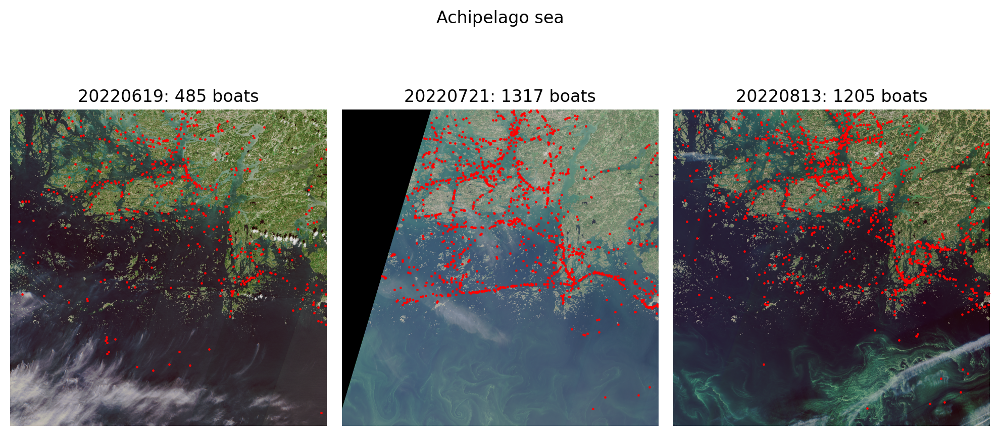

In [4]:
fig, axs = plt.subplots(1,3, dpi=200, figsize=(10,5))
for t, a in zip(['20220619.tif','20220721.tif', '20220813.tif'], axs):
    a.axis('off')
    with rio.open(image_path/'34VEM'/t) as src:
        rio_plot.show(src, ax=a)
    ships = gpd.read_file(shp_path/'34VEM'/t.replace('tif', 'shp'))
    ships['geometry'] = ships.geometry.centroid
    ships.plot(ax=a, color='red', markersize=.5)
    n_ships = len(ships)
    ships = None
    a.set_title(f'{t[:-4]}: {n_ships} boats')
plt.suptitle('Achipelago sea')
plt.tight_layout()
plt.show()

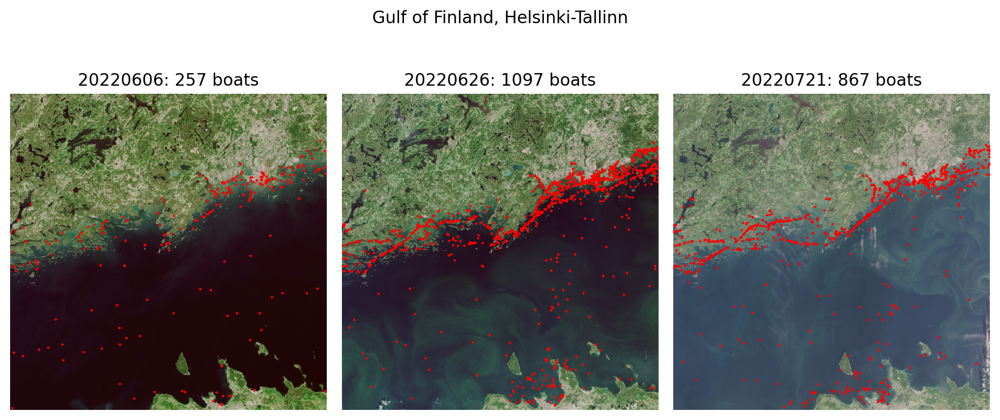

In [5]:
fig, axs = plt.subplots(1,3, dpi=200, figsize=(10,5))
for t, a in zip(['20220606.tif','20220626.tif', '20220721.tif'], axs):
    a.axis('off')
    with rio.open(image_path/'35VLG'/t) as src:
        rio_plot.show(src, ax=a)
    ships = gpd.read_file(shp_path/'35VLG'/t.replace('tif', 'shp'))
    ships['geometry'] = ships.geometry.centroid
    ships.plot(ax=a, color='red', markersize=.5)
    n_ships = len(ships)
    ships = None
    a.set_title(f'{t[:-4]}: {n_ships} boats')
plt.tight_layout()
plt.suptitle('Gulf of Finland, Helsinki-Tallinn')
plt.show()

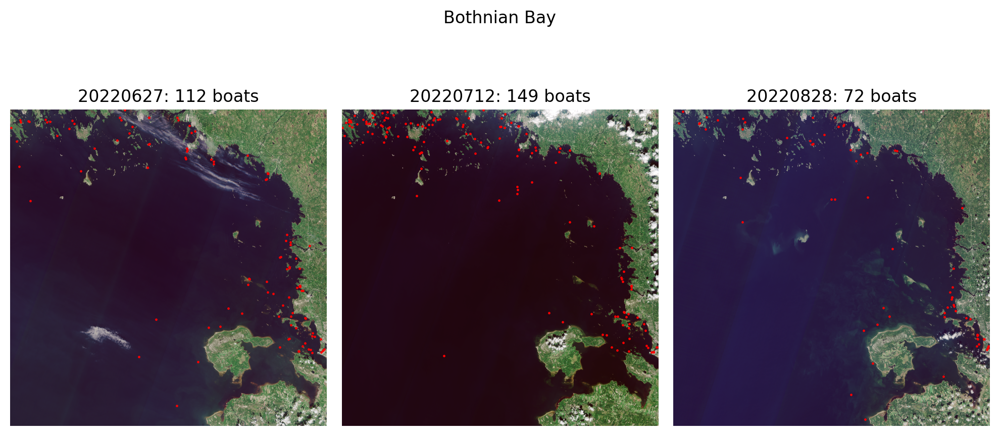

In [6]:
fig, axs = plt.subplots(1,3, dpi=200, figsize=(10,5))
for t, a in zip(['20220627.tif','20220712.tif', '20220828.tif'], axs):
    a.axis('off')
    with rio.open(image_path/'34WFT'/t) as src:
        rio_plot.show(src, ax=a)
    ships = gpd.read_file(shp_path/'34WFT'/t.replace('tif', 'shp'))
    ships['geometry'] = ships.geometry.centroid
    ships.plot(ax=a, color='red', markersize=.5)
    n_ships = len(ships)
    ships = None
    a.set_title(f'{t[:-4]}: {n_ships} boats')
plt.suptitle('Bothnian Bay')
plt.tight_layout()
plt.show()

## Test areas

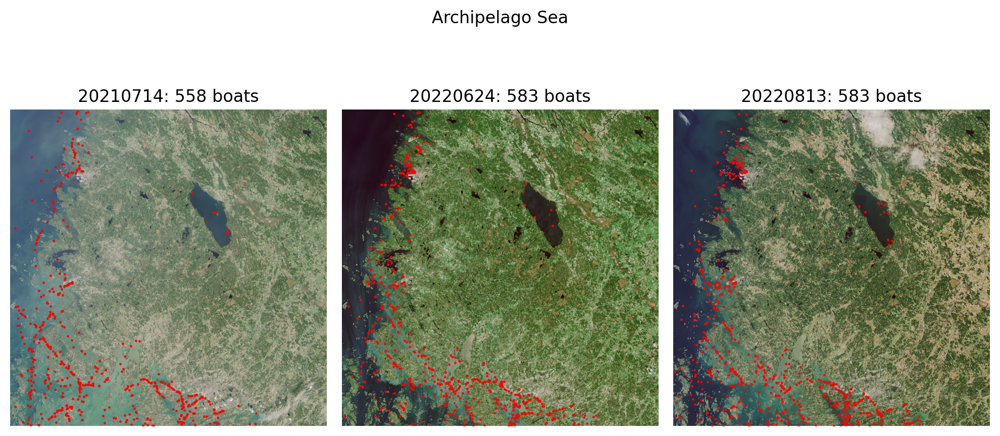

In [7]:
fig, axs = plt.subplots(1,3, dpi=200, figsize=(10,5))
for t, a in zip(['20210714.tif', '20220624.tif', '20220813.tif'], axs):
    a.axis('off')
    with rio.open(image_path/'34VEN'/t) as src:
        rio_plot.show(src, ax=a)
    ships = gpd.read_file(shp_path/'34VEN'/t.replace('tif', 'shp'))
    ships['geometry'] = ships.geometry.centroid
    ships.plot(ax=a, color='red', markersize=.5)
    n_ships = len(ships)
    ships = None
    a.set_title(f'{t[:-4]}: {n_ships} boats')
plt.suptitle('Archipelago Sea')
plt.tight_layout()
plt.show()

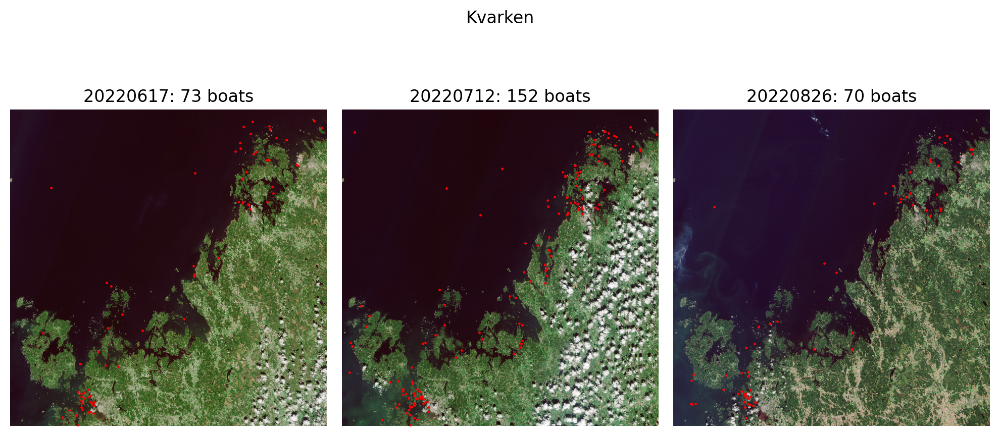

In [8]:
fig, axs = plt.subplots(1,3, dpi=200, figsize=(10,5))
for t, a in zip(['20220617.tif', '20220712.tif', '20220826.tif'], axs):
    a.axis('off')
    with rio.open(image_path/'34VER'/t) as src:
        rio_plot.show(src, ax=a)
    ships = gpd.read_file(shp_path/'34VER'/t.replace('tif', 'shp'))
    ships['geometry'] = ships.geometry.centroid
    ships.plot(ax=a, color='red', markersize=.5)
    n_ships = len(ships)
    ships = None
    a.set_title(f'{t[:-4]}: {n_ships} boats')
plt.suptitle('Kvarken')
plt.tight_layout()
plt.show()

# Quick data analysis for the annotated ships

First collate all ships into a single dataframe and project them to `EPSG:3067`.

In [117]:
all_ships = None

for t_id in ['34VEM', '35VLG', '34WFT', '34VEN', '34VER']:
    mosaics = [f for f in os.listdir(image_path/t_id) if 'tif' in f]
    for t in mosaics:
        ships = gpd.read_file(shp_path/t_id/t.replace('tif', 'shp'))
        ships['tile'] = f'{t_id}_{t[:-4]}'
        if all_ships is None: all_ships = ships.to_crs('epsg:3067')
        else: all_ships = pd.concat([all_ships, ships.to_crs('epsg:3067')])
            
def get_meas(geom, meas='diam'):
    box = geom.minimum_rotated_rectangle
    x, y = box.exterior.coords.xy
    edge_length = (Point(x[0], y[0]).distance(Point(x[1], y[1])), Point(x[1], y[1]).distance(Point(x[2], y[2])))
    if meas == 'min_edge': return min(edge_length)
    elif meas == 'max_edge': return max(edge_length)
    elif meas == 'diam': return np.sqrt(edge_length[0]**2 + edge_length[1]**2)
    
def get_aspect_ratio(geom):
    box = shapely.geometry.polygon.orient(geom).minimum_rotated_rectangle
    x, y = box.exterior.coords.xy
    w = Point(min(x), min(y)).distance(Point(max(x), min(y)))
    h = Point(min(x), min(y)).distance(Point(min(x), max(y)))
    return w/h
    
all_ships['bbox_area'] = all_ships.geometry.area
all_ships['min_edge'] = all_ships.geometry.apply(lambda row: get_meas(row, 'min_edge'))
all_ships['max_edge'] = all_ships.geometry.apply(lambda row: get_meas(row, 'max_edge'))
all_ships['diam'] = all_ships.geometry.apply(lambda row: get_meas(row, 'diam'))
all_ships['aspect_ratio'] = all_ships.geometry.apply(get_aspect_ratio)

Plot log-scaled histograms for bounding box area, diameter, shorter edge and longer edge.

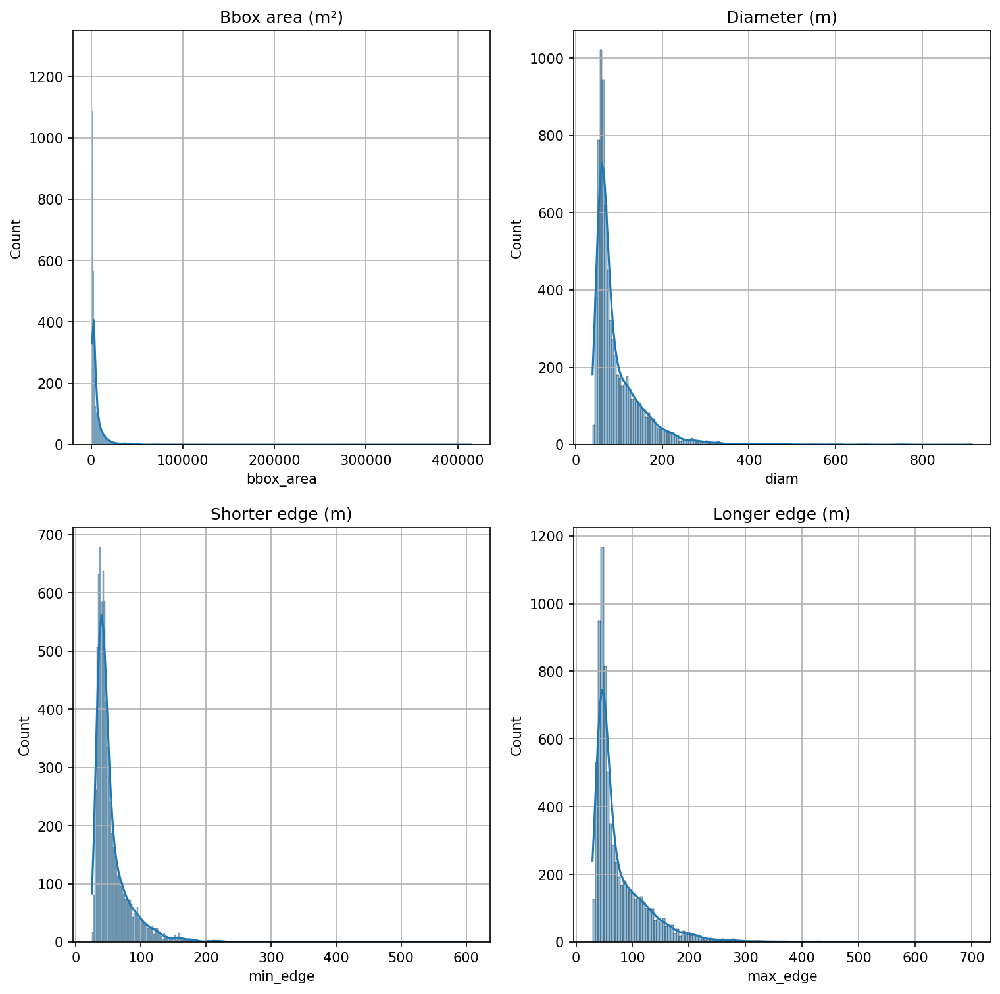

In [127]:
fig, axs = plt.subplots(2,2, dpi=150, figsize=(12,12))
for a in axs.flatten(): a.grid(True)
sns.histplot(all_ships.bbox_area, log_scale=False, ax=axs[0,0], kde=True).set_title('Bbox area (m²)')
sns.histplot(all_ships.diam, log_scale=False, ax=axs[0,1], kde=True).set_title('Diameter (m)')
sns.histplot(all_ships.min_edge, log_scale=False, ax=axs[1,0], kde=True).set_title('Shorter edge (m)')
sns.histplot(all_ships.max_edge, log_scale=False, ax=axs[1,1], kde=True).set_title('Longer edge (m)')
plt.show()

## Bounding box area

As most of the annotations cover also most of the wake of the marine vessel, the bounding boxes are significantly larger than a typical boat. There are a few annotations larger than 100 000 m², which are either cruise or cargo ships that are travelling along ordinal directions instead of cardinal directions, instead of e.g. smaller leisure boats.

In [119]:
all_ships.bbox_area.describe()

count      7580.000000
mean       5606.196180
std       11257.347462
min         753.937852
25%        1717.994773
50%        2493.311793
75%        5627.926638
max      414795.692722
Name: bbox_area, dtype: float64

## Diameter

Annotations typically have diameter less than 100 meters, and the largest diameters correspond to similar instances than the largest bounding box areas.

In [120]:
all_ships.diam.describe()

count    7580.000000
mean       95.646706
std        60.292898
min        39.061896
25%        59.296477
50%        72.101897
75%       113.827438
max       913.890352
Name: diam, dtype: float64

# Aspect ratio

Aspect ratio measures the ratio of the bounding boxes width to its height. Ratios close to 1 ($10^0$) mean near-square bounding boxes, ratios less than 1 correspond to boxes whose height is larger than width, and ratios larger than 1 correspond to boxes with height less than width. Overall the distribution of aspect ratios looks quite normal, and most boxes are either square or close to it.

Text(0.5, 1.0, 'Aspect ratio')

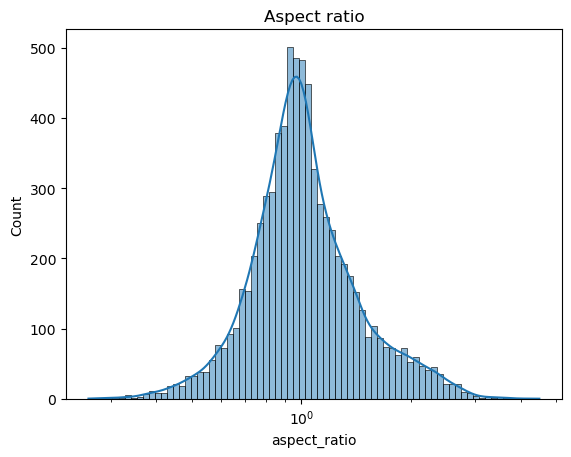

In [131]:
sns.histplot(all_ships.aspect_ratio, log_scale=True, kde=True).set_title('Aspect ratio')

# Training and validation data generation

[drone_detector](https://mayrajeo.github.io/drone_detector) package provides utilities for converting geospatial data to formats accepted by different deep learning frameworks. In this work, [YOLOv8](https://github.com/ultralytics/ultralytics) is used as the detection model, so the data must be converted to YOLO format. 

First step is to tile the data into smaller patches. `drone_detector.processing.tiling.Tiler` does this. Then data is converted to YOLO specifications with `drone_detector.processing.yolo.YOLOProcessor`.

In [132]:
from drone_detector.processing.tiling import Tiler
from drone_detector.processing.yolo import *

We need to specify some datapaths, tilesize (here 320x320px) and overlap (here (0,0)).

In [133]:
#| output: false

tilesize = 320
overlap = (0,0)

outpath = Path('../data/processed/')

for t in ['20220619','20220721', '20220813']:
    tiler = Tiler(outpath/'34VEM'/t, gridsize_x=tilesize, gridsize_y=tilesize, overlap=overlap)
    tiler.tile_raster(image_path/'34VEM'/f'{t}.tif')
    tiler.tile_vector(shp_path/'34VEM'/f'{t}.shp')
    cats = ['boat']
    yolo_proc = YOLOProcessor(outpath/'34VEM'/t, outpath/'34VEM'/t, cats)
    yolo_proc.from_shp('id', ann_format='box')
    
grid_34vem = tiler.grid
    
for t in ['20220606','20220626', '20220721']:
    tiler = Tiler(outpath/'35VLG'/t, gridsize_x=tilesize, gridsize_y=tilesize, overlap=overlap)
    tiler.tile_raster(image_path/'35VLG'/f'{t}.tif')
    tiler.tile_vector(shp_path/'35VLG'/f'{t}.shp')
    cats = ['boat']
    yolo_proc = YOLOProcessor(outpath/'35VLG'/t, outpath/'35VLG'/t, cats)
    yolo_proc.from_shp('id', ann_format='box')
    
grid_35vlg = tiler.grid

for t in ['20220627','20220712', '20220828']:
    tiler = Tiler(outpath/'34WFT'/t, gridsize_x=tilesize, gridsize_y=tilesize, overlap=overlap)
    tiler.tile_raster(image_path/'34WFT'/f'{t}.tif')
    tiler.tile_vector(shp_path/'34WFT'/f'{t}.shp')
    cats = ['boat']
    yolo_proc = YOLOProcessor(outpath/'34WFT'/t, outpath/'34WFT'/t, cats)
    yolo_proc.from_shp('id', ann_format='box')
    
grid_34wft = tiler.grid

1225it [00:41, 29.17it/s]
1156it [00:10, 106.90it/s]
261it [00:09, 27.46it/s]
1225it [00:39, 31.21it/s]
1156it [00:13, 87.60it/s] 
355it [00:16, 21.76it/s]
1225it [00:42, 28.68it/s]
1156it [00:12, 91.50it/s] 
372it [00:14, 24.80it/s]
1225it [00:37, 32.40it/s]
1156it [00:06, 187.98it/s]
132it [00:04, 27.43it/s]
1225it [00:40, 29.89it/s]
1156it [00:09, 119.60it/s]
238it [00:10, 21.80it/s]
1225it [00:39, 31.37it/s]
1156it [00:09, 128.34it/s]
225it [00:10, 22.23it/s]
1225it [00:39, 31.14it/s]
1156it [00:04, 260.82it/s]
74it [00:02, 34.64it/s]
1225it [00:37, 32.62it/s]
1156it [00:05, 225.75it/s]
89it [00:02, 34.61it/s]
1225it [00:39, 30.73it/s]
1156it [00:03, 299.92it/s]
51it [00:01, 34.91it/s]


`yaml`-file that defines the datasets is still a work in progress so we need to do it manually. Folder format is the following:

```
processed-|
          |tile_id|
                  |date-|
                  |     |-images # patches as 320x320px tif files
                  |     |-labels # annotations in yolo format
                  |     |-vectors # annotations in geojson format
                  |     |yolo.yaml # yaml file for yolo dataset for this folder
          ...
          |yolo.yaml # we need this file to have both folders in a single dataset
          |train.txt
          |val.txt
```

From these tiles, split them into five equal sized folds so that:

* All folds contain data from all timesteps and locations
* All patches in both sets are unique to prevent data leakage
* All patches that contain a boat **in any timestep** are taken into account
  * Some patches without annotations are then in both sets

In [ ]:
import random
random.seed(123)

patch_ids_34VEM = [t[:-4] for t in set().union(*(os.listdir(outpath/'34VEM/20220619/labels'),
                                                 os.listdir(outpath/'34VEM/20220721/labels'),
                                                 os.listdir(outpath/'34VEM/20220813/labels')))]

patch_ids_35VLG = [t[:-4] for t in set().union(*(os.listdir(outpath/'35VLG/20220606/labels'),
                                                 os.listdir(outpath/'35VLG/20220626/labels'),
                                                 os.listdir(outpath/'35VLG/20220721/labels')))]

patch_ids_34WFT = [t[:-4] for t in set().union(*(os.listdir(outpath/'34WFT/20220627/labels'),
                                                 os.listdir(outpath/'34WFT/20220712/labels'),
                                                 os.listdir(outpath/'34WFT/20220828/labels')))]

ixs_34VEM = list(range(0, len(patch_ids_34VEM)))
random.shuffle(ixs_34VEM)
folds_34VEM = [patch_ids_34VEM[i::5] for i in range(5)]

ixs_35VLG = list(range(0, len(patch_ids_35VLG)))
random.shuffle(ixs_35VLG)
folds_35VLG = [patch_ids_35VLG[i::5] for i in range(5)]


ixs_34WFT = list(range(0, len(patch_ids_34WFT)))
random.shuffle(ixs_34WFT)
folds_34WFT = [patch_ids_34WFT[i::5] for i in range(5)]

for i in range(5):
    with open(outpath/f'fold_{i+1}.txt', 'w') as dest:
        for j in folds_34VEM[i]:
            dest.write(f'{os.path.abspath(outpath)}/34VEM/20220619/images/{j}.tif\n')
            dest.write(f'{os.path.abspath(outpath)}/34VEM/20220721/images/{j}.tif\n')
            dest.write(f'{os.path.abspath(outpath)}/34VEM/20220813/images/{j}.tif\n')
        for j in folds_35VLG[i]:
            dest.write(f'{os.path.abspath(outpath)}/35VLG/20220606/images/{j}.tif\n')
            dest.write(f'{os.path.abspath(outpath)}/35VLG/20220626/images/{j}.tif\n')
            dest.write(f'{os.path.abspath(outpath)}/35VLG/20220721/images/{j}.tif\n')
        for j in folds_34WFT[i]:
            dest.write(f'{os.path.abspath(outpath)}/34WFT/20220627/images/{j}.tif\n')
            dest.write(f'{os.path.abspath(outpath)}/34WFT/20220712/images/{j}.tif\n')
            dest.write(f'{os.path.abspath(outpath)}/34WFT/20220828/images/{j}.tif\n')

Visualize folds

Text(0.5, 1.0, '34WFT')

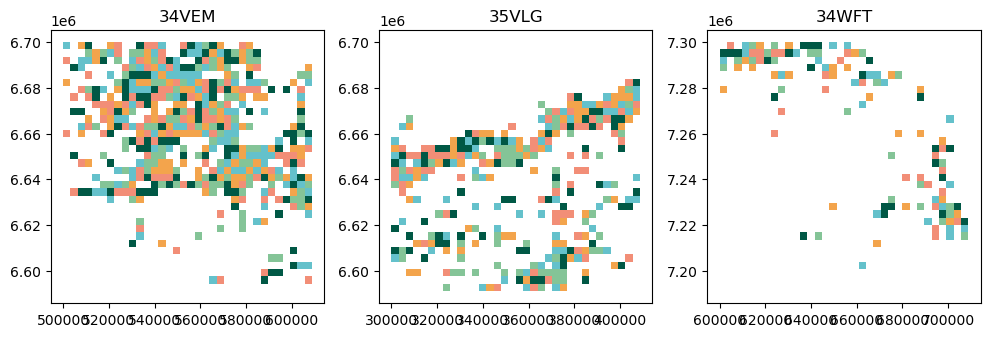

In [ ]:
from matplotlib.colors import ListedColormap

grid_34vem['fold'] = 'excluded'
grid_35vlg['fold'] = 'excluded'
grid_34wft['fold'] = 'excluded'
for i in range(5):
    grid_34vem['fold'] = grid_34vem.apply(lambda row: f'Fold {i+1}' if row.cell in folds_34VEM[i] else row.fold, axis=1)
    grid_35vlg['fold'] = grid_35vlg.apply(lambda row: f'Fold {i+1}' if row.cell in folds_35VLG[i] else row.fold, axis=1)
    grid_34wft['fold'] = grid_34wft.apply(lambda row: f'Fold {i+1}' if row.cell in folds_34WFT[i] else row.fold, axis=1)

fig, axs = plt.subplots(1,3, figsize=(12,5))

cmap = ListedColormap(["#005845", "#84C497", "#F28E77", "#64C1CB", "#F3A44C", 'white'])

grid_34vem.plot(column='fold', legend=False, ax=axs[0], cmap=cmap).set_title('34VEM')
grid_35vlg.plot(column='fold', legend=False, ax=axs[1], cmap=cmap).set_title('35VLG')
grid_34wft.plot(column='fold', legend=False, ax=axs[2], cmap=cmap).set_title('34WFT')

Finally construct the base `yolo.yaml` file for the dataset.

In [ ]:
with open(outpath/'yolo.yaml', 'w') as dest:
    dest.write('# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3: list: [path/to_imgs1, path_to_imgs2, ..]\n')
    dest.write(f'path: {os.path.abspath(outpath)}/ # dataset root dir \n')
    dest.write(f"train: # train images (relative to 'path')\n")
    dest.write(f"  - fold_1.txt\n")
    dest.write(f"  - fold_2.txt\n")
    dest.write(f"  - fold_3.txt\n")
    dest.write(f"  - fold_4.txt\n")
    dest.write(f"val: # val images (relative to 'path')\n")
    dest.write(f"  - fold_5.txt\n")
    dest.write(f"test: # test images (relative to 'path')\n")
    dest.write('\n# Classes\n')
    dest.write('names:\n')
    dest.write('  0: boat')           